# PCA Index Dashboard Examples

In [1]:
import pull_fred
import pandas as pd
import plotly.express as px

import pca_index
from settings import config

DATA_DIR = config("DATA_DIR")

import warnings

warnings.filterwarnings("ignore")

In [2]:
now = pd.Timestamp.utcnow()
# convert now to central time
print(f"This script was last run at {now} (UTC)")
print(f"In US/Central Time, this is {now.tz_convert('US/Central')}")

This script was last run at 2025-03-08 10:01:34.143690+00:00 (UTC)
In US/Central Time, this is 2025-03-08 04:01:34.143690-06:00


In [3]:
df = pull_fred.load_fred(data_dir=DATA_DIR)
dfn = pca_index.transform_series(df)

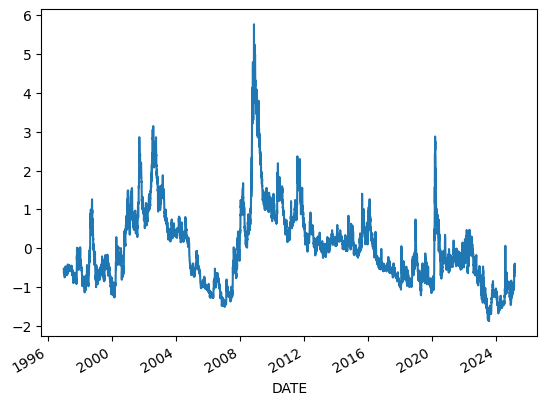

In [4]:
## Visualize Principal Component 1
pc1, loadings = pca_index.pca(dfn, module="scikitlearn")
pc1.plot();

In [5]:
# Simple version
fig = px.line(pc1)
fig.show()

In [6]:
# Using slider and quick views
fig = pca_index.pc1_line_plot(pc1)
fig.show()

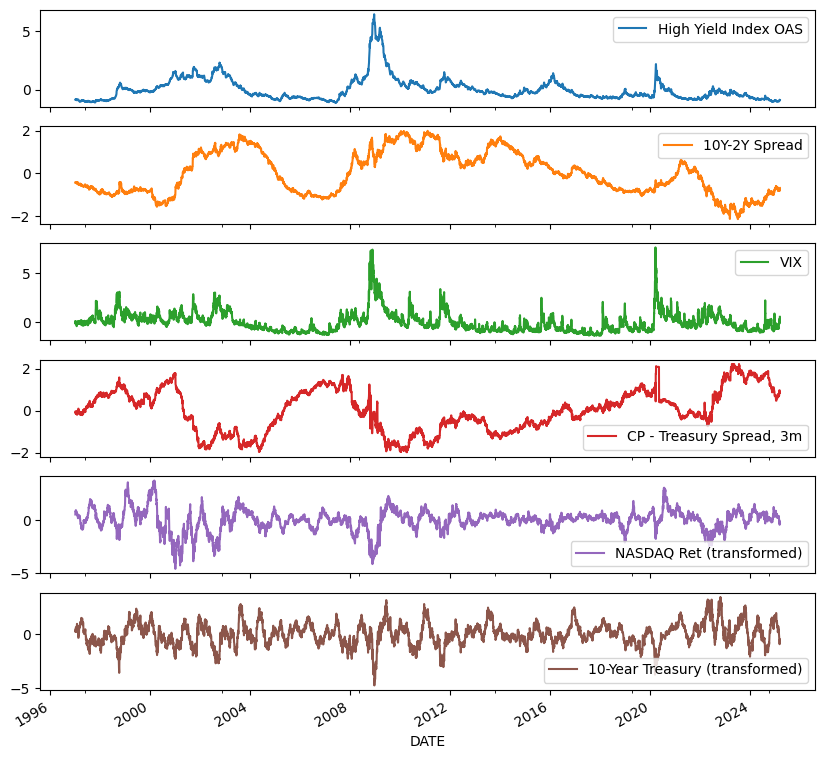

In [7]:
## Visualize normalized and raw series
dfn.plot(subplots=True, figsize=(10, 10));


In [8]:
fig = px.line(dfn, facet_col="variable", facet_col_wrap=1)
fig.update_yaxes(matches=None)
fig.show()


In [9]:
fig = pca_index.plot_unnormalized_series(df)
fig.show()

In [10]:
fig = pca_index.plot_normalized_series(dfn)
fig.show()